In [1]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12638, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 12638 (delta 8), reused 9 (delta 3), pack-reused 12618
Receiving objects: 100% (12638/12638), 12.54 MiB | 30.01 MiB/s, done.
Resolving deltas: 100% (8661/8661), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.1 MB/s 
     |████████████████████████████████| 145 kB 4.8 MB/s 
     |████████████████████████████████| 178 kB 51.3 MB/s 
     |████████████████████████████████| 1.1 MB 65.0 MB/s 
     |████████████████████████████████| 67 kB 7.6 MB/s 
     |████████████████████████████████| 54 kB 3.6 MB/s 
     |████████████████████████████████| 138 kB 71.7 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key="dOup7y8oN6iTcFGXEQDw")
project = rf.workspace("pratyush-kumar-patnaik").project("micro-organism")
dataset = project.version(4).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/micro-organism-4 in yolov5pytorch:: 100%|██████████| 1730/1730 [00:00<00:00, 1733.60it/s]


In [5]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5m.pt --cache

train: weights=yolov5m.pt, cfg=, data=/content/datasets/micro-organism-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-388-gf1214f2 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hs

In [6]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/micro-organism-4/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-388-gf1214f2 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 290 layers, 20921631 parameters, 0 gradients, 48.1 GFLOPs
image 1/37 /content/datasets/micro-organism-4/test/images/EMDS5-g01-08_png.rf.3ae0077ee983b55a75556a01dc4c1224.jpg: 416x416 1 1, Done. (0.018s)
image 2/37 /content/datasets/micro-organism-4/test/images/EMDS5-g02-05_png.rf.bb5bdd31c11a9826b71fd9e99c62c42b.jpg: 416x416 1 4, 1 7, Done. (0.018s)
image 3/37 /content/datasets/micro-organ

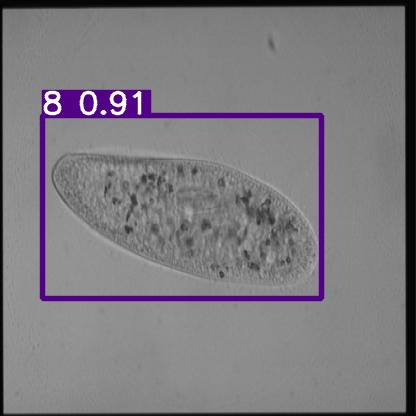

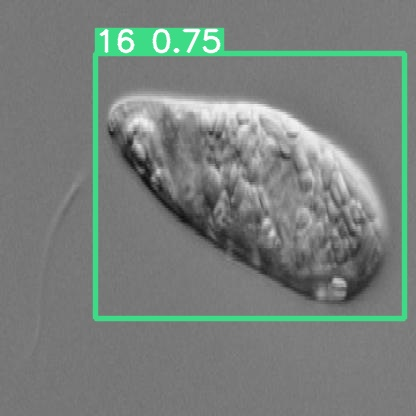

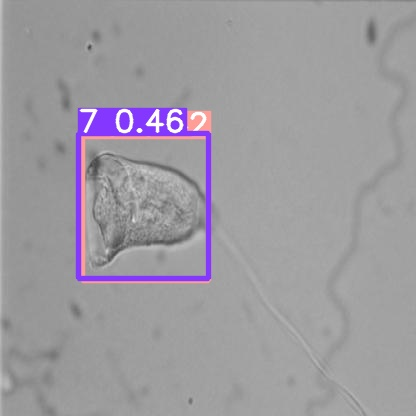

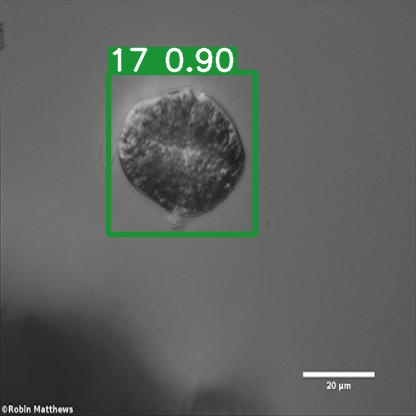

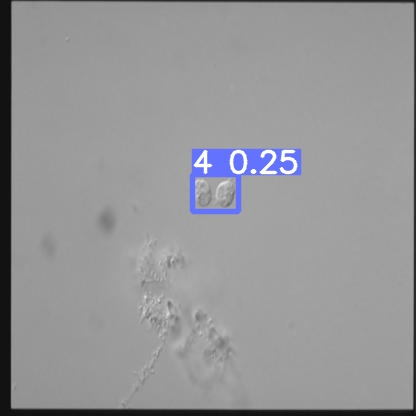

...

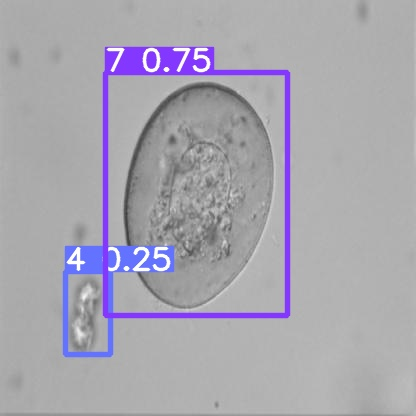

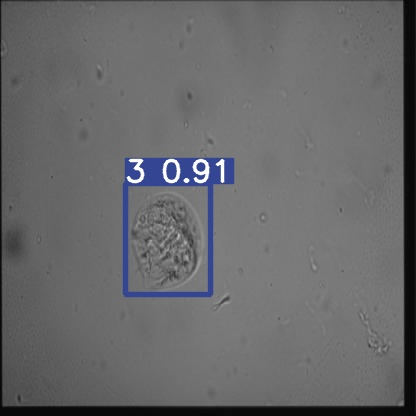

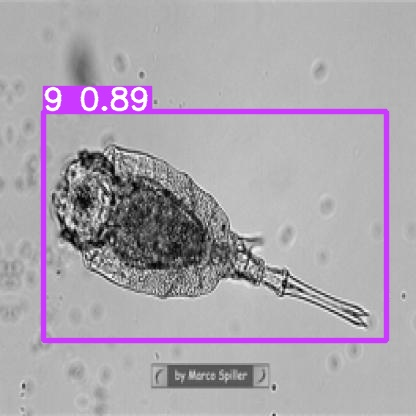

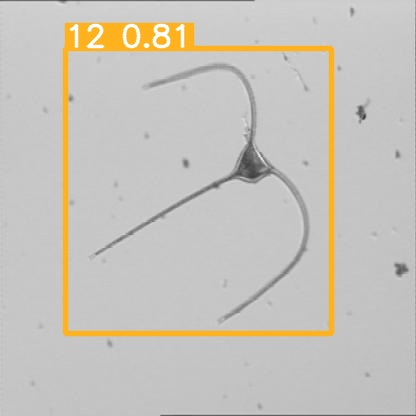

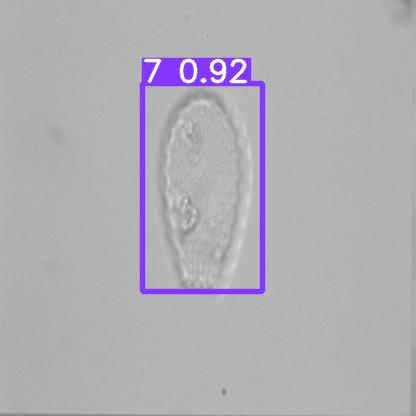

In [8]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [8]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [12]:
!zip -r /content/datasets.zip /content/datasets

  adding: content/datasets/ (stored 0%)
  adding: content/datasets/micro-organism-4/ (stored 0%)
  adding: content/datasets/micro-organism-4/valid/ (stored 0%)
  adding: content/datasets/micro-organism-4/valid/images/ (stored 0%)
  adding: content/datasets/micro-organism-4/valid/images/EMDS5-g20-12_png.rf.72d474f32c7c3f9a382307014fc549d4.jpg (deflated 8%)
  adding: content/datasets/micro-organism-4/valid/images/EMDS5-g15-03_png.rf.a56735c187a966ae20648b6cabdc80d2.jpg (deflated 3%)
  adding: content/datasets/micro-organism-4/valid/images/EMDS5-g09-07_png.rf.33f5794f64b0b48126ddb9dabf62d754.jpg (deflated 2%)
  adding: content/datasets/micro-organism-4/valid/images/EMDS5-g04-05_png.rf.365d1a9bcac46ab7f5f5c8d359eed3e9.jpg (deflated 14%)
  adding: content/datasets/micro-organism-4/valid/images/EMDS5-g04-10_png.rf.178f05b20812d8124fd51baa6c96ecae.jpg (deflated 7%)
  adding: content/datasets/micro-organism-4/valid/images/EMDS5-g07-08_png.rf.ae5108c9e6c06b52fa8025b76181a7c6.jpg (deflated 19%)


In [11]:
!zip -r /content/yolov5.zip /content/yolov5

  adding: content/yolov5/ (stored 0%)
  adding: content/yolov5/yolov5m.pt (deflated 8%)
  adding: content/yolov5/runs/ (stored 0%)
  adding: content/yolov5/runs/train/ (stored 0%)
  adding: content/yolov5/runs/train/exp/ (stored 0%)
  adding: content/yolov5/runs/train/exp/val_batch1_pred.jpg (deflated 18%)
  adding: content/yolov5/runs/train/exp/val_batch1_labels.jpg (deflated 18%)
  adding: content/yolov5/runs/train/exp/hyp.yaml (deflated 45%)
  adding: content/yolov5/runs/train/exp/val_batch0_pred.jpg (deflated 16%)
  adding: content/yolov5/runs/train/exp/results.csv (deflated 83%)
  adding: content/yolov5/runs/train/exp/val_batch0_labels.jpg (deflated 16%)
  adding: content/yolov5/runs/train/exp/train_batch0.jpg (deflated 10%)
  adding: content/yolov5/runs/train/exp/weights/ (stored 0%)
  adding: content/yolov5/runs/train/exp/weights/last.pt (deflated 8%)
  adding: content/yolov5/runs/train/exp/weights/best.pt (deflated 8%)
  adding: content/yolov5/runs/train/exp/weights/best-fp16.t

In [10]:
!python export.py --weights runs/train/exp/weights/best.pt --include tflite --img 416

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[416], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v6.1-388-gf1214f2 Python-3.7.13 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 290 layers, 20921631 parameters, 0 gradients, 48.1 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 10647, 23) (40.3 MB)

TensorFlow SavedModel: starting export with tensorflow 2.8.2...

                 from  n    params  module                                  arguments                     
2022-08-13 13:07:48.659403: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
  0                -1  1     